<a href="https://colab.research.google.com/github/Siamakrajabigh/depression/blob/main/Depresjion_SSA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install  statsmodels
!pip install --upgrade pandas
!pip install --upgrade numpy
!pip install --upgrade matplotlib
!pip install kaleido
!pip install fastapi
!pip install python-multipart
!pip install uvicorn

In [ ]:
!pip install pyActigraphy

In [ ]:
!pip install --upgrade scipy
!pip install pandas
! pip install numpy==1.25.0

In [ ]:
import os
from datetime import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import pyActigraphy
import plotly.graph_objects as go

In [ ]:
# Define the path to your uploaded zip file
zip_path = '/content/depresjon.zip'  # Make sure to replace 'your_zip_file.zip' with your actual file name

# Define the directory where you want to extract the files
extracted_path = '/content/extracted/'

# Create the directory if it doesn't exist
os.makedirs(extracted_path, exist_ok=True)

# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_path)

# List the files in the extracted directory
extracted_files = os.listdir(extracted_path)

# Print the list of files
print("Extracted Files:")
for file in extracted_files:
    print(file)

Extracted Files:
data


In [ ]:
from pandas.tseries import frequencies
extracted_data = pd.read_csv('/content/extracted/data/control/control_1.csv')
d = {'timestamp': extracted_data['timestamp'], 'date': extracted_data['date'], 'activity': extracted_data['activity']}
index = pd.date_range(start='18/03/2003  3:00:00 PM',freq='60s',periods=51611)
data = pd.DataFrame(data=d, index=index)
data['timestamp'] = pd.to_datetime(data['timestamp'])
#data.set_index('timestamp', inplace=True)
data['activity'] = extracted_data['activity'].values
data['timestamp'] = extracted_data['timestamp'].values
data['date'] = extracted_data['date'].values
data

,timestamp,date,activity
2003-03-18 15:00:00,2003-03-18 15:00:00,2003-03-18,60
2003-03-18 15:01:00,2003-03-18 15:01:00,2003-03-18,0
2003-03-18 15:02:00,2003-03-18 15:02:00,2003-03-18,264
2003-03-18 15:03:00,2003-03-18 15:03:00,2003-03-18,662
2003-03-18 15:04:00,2003-03-18 15:04:00,2003-03-18,293
...,...,...,...
2003-04-23 11:06:00,2003-04-23 12:06:00,2003-04-23,3
2003-04-23 11:07:00,2003-04-23 12:07:00,2003-04-23,3
2003-04-23 11:08:00,2003-04-23 12:08:00,2003-04-23,3
2003-04-23 11:09:00,2003-04-23 12:09:00,2003-04-23,3


In [ ]:
from pyActigraphy.io import BaseRaw
raw = BaseRaw(
    name="control_1",
    uuid='DeviceId',
    format='Pandas',
    axial_mode=None,
    start_time=data.index[0],
    period=(data.index[-1]-data.index[0]),
    frequency=index.freq,
    data=data['activity'],
    light=None
)

In [ ]:
raw.data

2003-03-18 15:00:00     60
2003-03-18 15:01:00      0
2003-03-18 15:02:00    264
2003-03-18 15:03:00    662
2003-03-18 15:04:00    293
                      ... 
2003-04-23 11:06:00      3
2003-04-23 11:07:00      3
2003-04-23 11:08:00      3
2003-04-23 11:09:00      3
2003-04-23 11:10:00      0
Freq: 60S, Name: activity, Length: 51611, dtype: int64

In [ ]:
from pyActigraphy.analysis import SSA

In [ ]:
mySSA = SSA(raw.data,window_length='24h')
# Access the trajectory matrix
mySSA.trajectory_matrix().shape

(1440, 50172)

In [ ]:
mySSA.fit()

In [ ]:
# By definition, the sum of the partial variances should be equal to 1:
mySSA.lambda_s.sum()

0.9999999999999999

In [ ]:
layout = go.Layout(
    height=600,
    width=800,
    title="Scree diagram",
    xaxis=dict(title="Singular value index", type='log', showgrid=True, gridwidth=1, gridcolor='LightPink', title_font = {"size": 20}),
    yaxis=dict(title=r'$\lambda_{k} / \lambda_{tot}$', type='log', showgrid=True, gridwidth=1, gridcolor='LightPink', ),
    showlegend=False
)

In [ ]:
go.Figure(data=[go.Scatter(x=np.arange(0,len(mySSA.lambda_s)+1),y=mySSA.lambda_s)], layout=layout)

In [ ]:
x_elem_0 = mySSA.X_elementary(r=0)
x_elem_0.shape

(1440, 50172)

In [ ]:
w_corr_mat = mySSA.w_correlation_matrix(5)

In [ ]:
go.Figure(data=[go.Heatmap(z=w_corr_mat)], layout=go.Layout(height=800,width=800))


In [ ]:
trend = mySSA.X_tilde(0)
# By definition, the reconstructed components must have the same dimension as the original signal:
trend.shape[0] == len(raw.data.index)

True

In [ ]:
et12 = mySSA.X_tilde([1,2])
et34 = mySSA.X_tilde([3,4])

In [ ]:
layout = go.Layout(
    height=600,
    width=800,
    title="",
    xaxis=dict(title='Date Time'),
    yaxis=dict(title='Count'),
    shapes=[],
    showlegend=True
)

In [ ]:
go.Figure(data=[
    go.Scatter(x=raw.data.index,y=raw.data, name='Activity'),
    go.Scatter(x=raw.data.index,y=trend, name='Trend'),
    go.Scatter(x=raw.data.index,y=trend+et12, name='Circadian component'),
    go.Scatter(x=raw.data.index,y=trend+et34, name='Ultradian component')
], layout=layout)

In [ ]:
rec = mySSA.reconstructed_signal([1,2])

In [ ]:
go.Figure(data=[
    go.Scatter(x=raw.data.index, y=raw.data, name='Activity'),
    go.Scatter(x=raw.data.index, y=rec, name='Reconstructed signal')
], layout=go.Layout(height=600,width=800,showlegend=True))

In [ ]:
print(type(rec))
print(rec)


<class 'pandas.core.series.Series'>
2003-03-18 15:00:00    185.155945
2003-03-18 15:01:00    186.752289
2003-03-18 15:02:00    188.150742
2003-03-18 15:03:00    189.491501
2003-03-18 15:04:00    190.645935
                          ...    
2003-04-23 11:06:00      1.405828
2003-04-23 11:07:00      1.393651
2003-04-23 11:08:00      1.381088
2003-04-23 11:09:00      1.367889
2003-04-23 11:10:00      1.353230
Freq: 60S, Length: 51611, dtype: float32


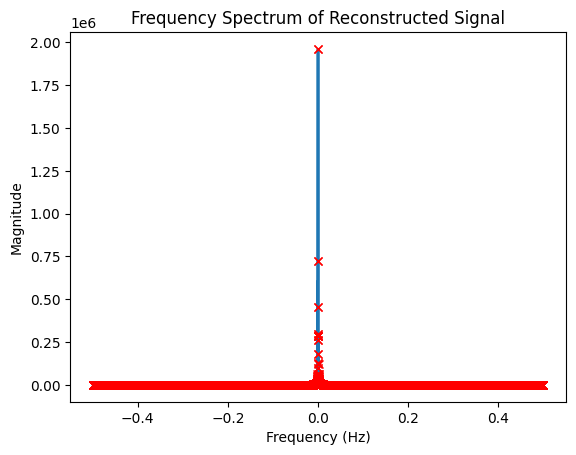

Frequencies: [ 1.93757145e-05  5.81271434e-05  1.16254287e-04 ... -1.74381430e-04
 -1.16254287e-04 -5.81271434e-05]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft
from scipy.signal import find_peaks

# Assuming 'rec' is the reconstructed signal (a Pandas Series)
rec_values = rec.values
x = np.arange(len(rec_values))

# Perform FFT
fft_result = fft(rec_values)
fft_freqs = np.fft.fftfreq(len(rec_values), d=1)  # Assuming the signal is sampled with a unit time interval
magnitude_spectrum = np.abs(fft_result)

# Find peaks in the frequency spectrum
peaks, _ = find_peaks(magnitude_spectrum, height=0.1)  # Adjust the height threshold as needed

# Extract corresponding frequencies
peak_frequencies = fft_freqs[peaks]

# Plot the frequency spectrum and highlight the peaks
plt.plot(fft_freqs, magnitude_spectrum)
plt.plot(peak_frequencies, magnitude_spectrum[peaks], 'rx')  # Mark peaks with red crosses
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title('Frequency Spectrum of Reconstructed Signal')
plt.show()

# Print the identified frequencies
print("Frequencies:", peak_frequencies)


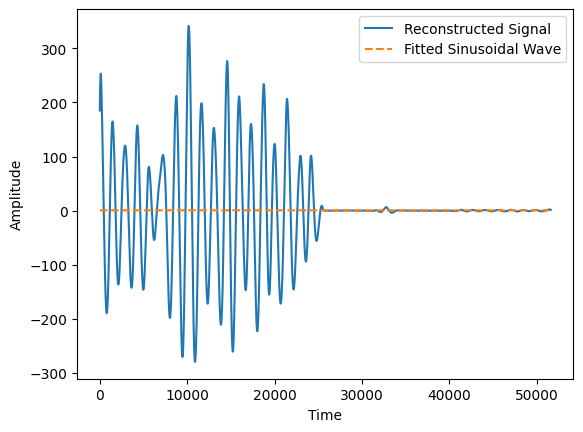

Amplitude: 0.0036065382402943975
Frequency: 0.1000068366701868
Phase: -2.4897224095250876
Offset: 0.6013619942664101


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Assuming 'rec' is the reconstructed signal
x = np.arange(len(rec))

# Define the function for a sinusoidal wave
def sinusoidal_function(x, amplitude, frequency, phase, offset):
    return amplitude * np.cos(2 * np.pi * frequency * x + phase) + offset

# Use curve fitting to estimate parameters
initial_guess = [1.0, 0.1, 0.0, 0.0]  # Initial guess for [amplitude, frequency, phase, offset]
params, covariance = curve_fit(sinusoidal_function, x, rec, p0=initial_guess)

# Extract the parameters
amplitude, frequency, phase, offset = params

# Generate the fitted sinusoidal wave
fitted_wave = sinusoidal_function(x, amplitude, frequency, phase, offset)

# Plot the original signal and the fitted sinusoidal wave
plt.plot(x, rec, label='Reconstructed Signal')
plt.plot(x, fitted_wave, label='Fitted Sinusoidal Wave', linestyle='--')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

# Print the extracted parameters
print("Amplitude:", amplitude)
print("Frequency:", frequency)
print("Phase:", phase)
print("Offset:", offset)


In [ ]:
import plotly.graph_objects as go
from pyActigraphy.analysis import Cosinor
cosinor = Cosinor()
#cosinor.fit_initial_params['Period'].value = 16
cosinor.fit_initial_params['Period'].vary = False
cosinor.fit_initial_params.pretty_print()

Name          Value      Min      Max   Stderr     Vary     Expr Brute_Step
Acrophase     3.142        0    6.283     None     True     None     None
Amplitude        50        0      inf     None     True     None     None
Mesor            50        0      inf     None     True     None     None
Period         1440        0      inf     None    False     None     None


In [ ]:

results = cosinor.fit(rec, verbose=True) # Set verbose to True to print the fit output

[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 34
    # data points      = 51611
    # variables        = 3
    chi-square         = 2.8823e+08
    reduced chi-square = 5584.94064
    Akaike info crit   = 445293.887
    Bayesian info crit = 445320.441
[[Variables]]
    Amplitude:  74.7587010 +/- 0.46545533 (0.62%) (init = 50)
    Acrophase:  6.13495839 +/- 0.00621993 (0.10%) (init = 3.141593)
    Period:     1440 (fixed)
    Mesor:      0.85457957 +/- 0.32896175 (38.49%) (init = 50)


In [ ]:
results.params.valuesdict()

{'Amplitude': 74.75870104693367,
 'Acrophase': 6.134958389359444,
 'Period': 1440,
 'Mesor': 0.8545795680157662}

In [ ]:
fig = go.Figure(go.Scatter(x=rec.index.astype(str),y=rec))

In [ ]:
fig.show()

In [ ]:
best_fit = cosinor.best_fit(rec, results.params)

In [ ]:
fig = go.Figure(
    data=[
        go.Scatter(x=rec.index.astype(str),y=rec,name='Raw data'),
        go.Scatter(x=best_fit.index.astype(str),y=best_fit,name='Best fit')
    ]
)

In [ ]:
fig.show()

In [ ]:
path = '/content/extracted/data/control/'
dirs = os.listdir(path)
cosinor_result = []
from pyActigraphy.io import BaseRaw
import plotly.graph_objects as go
from pyActigraphy.analysis import Cosinor

print(dirs)
for filepath in dirs:
    source = filepath.split('.')[0]
    if filepath.endswith('.csv'):
      extracted_data = pd.read_csv(path + filepath)
      d = {'timestamp': extracted_data['timestamp'], 'date': extracted_data['date'], 'activity': extracted_data['activity']}
      index = pd.date_range(start=extracted_data['timestamp'].min(),freq='60s',periods=len(extracted_data))
      data = pd.DataFrame(data=d, index=index)
      data['timestamp'] = pd.to_datetime(data['timestamp'])
      #data.set_index('timestamp', inplace=True)
      data['activity'] = extracted_data['activity'].values
      data['timestamp'] = extracted_data['timestamp'].values
      data['date'] = extracted_data['date'].values

      raw = BaseRaw(
            name=source,
            uuid='DeviceId',
            format='Pandas',
            axial_mode=None,
            start_time=data.index[0],
            period=(data.index[-1]-data.index[0]),
            frequency=index.freq,
            data=data['activity'],
            light=None
      )
      mySSA = SSA(raw.data,window_length='24h')
      mySSA.fit()
      trend = mySSA.X_tilde(0)
      et12 = mySSA.X_tilde([1,2])
      et34 = mySSA.X_tilde([3,4])
      rec = mySSA.reconstructed_signal([1,2])

      cosinor = Cosinor()
      cosinor.fit_initial_params['Period'].vary = False
      results = cosinor.fit(rec, verbose=False) # Set verbose to True to print the fit output
      loop_result = results.params.valuesdict()
      loop_result['File_Name'] = raw.name
      cosinor_result.append(loop_result)
df_controls = pd.DataFrame(cosinor_result)
print(df_controls)

['control_7.csv', 'control_3.csv', 'control_10.csv', 'control_12.csv', 'control_31.csv', 'control_9.csv', 'control_32.csv', 'control_19.csv', 'control_22.csv', 'control_28.csv', 'control_24.csv', 'control_13.csv', 'control_1.csv', 'control_27.csv', 'control_18.csv', 'control_23.csv', 'control_4.csv', 'control_25.csv', 'control_8.csv', 'control_20.csv', 'control_29.csv', 'control_15.csv', 'control_26.csv', 'control_11.csv', 'control_16.csv', 'control_14.csv', 'control_6.csv', 'control_30.csv', 'control_17.csv', 'control_5.csv', 'control_21.csv', 'control_2.csv']
       Amplitude  Acrophase  Period         Mesor   File_Name
0   2.380505e-08   3.808877    1440  7.634577e-01   control_7
1   6.410023e+01   6.222785    1440  1.847037e-08   control_3
2   2.166695e+02   5.129825    1440  3.729157e-10  control_10
3   8.321206e+01   4.963891    1440  5.626377e-01  control_12
4   1.205718e+02   5.867120    1440  2.645986e-01  control_31
5   9.229485e+01   4.500594    1440  6.216301e-08   control_

In [ ]:
path = '/content/extracted/data/condition/'
dirs = os.listdir(path)
cosinor_result = []
from pyActigraphy.io import BaseRaw
import plotly.graph_objects as go
from pyActigraphy.analysis import Cosinor

print(dirs)
for filepath in dirs:
    source = filepath.split('.')[0]
    if filepath.endswith('.csv'):
      extracted_data = pd.read_csv(path + filepath)
      d = {'timestamp': extracted_data['timestamp'], 'date': extracted_data['date'], 'activity': extracted_data['activity']}
      index = pd.date_range(start=extracted_data['timestamp'].min(),freq='60s',periods=len(extracted_data))
      data = pd.DataFrame(data=d, index=index)
      data['timestamp'] = pd.to_datetime(data['timestamp'])
      #data.set_index('timestamp', inplace=True)
      data['activity'] = extracted_data['activity'].values
      data['timestamp'] = extracted_data['timestamp'].values
      data['date'] = extracted_data['date'].values

      raw = BaseRaw(
            name=source,
            uuid='DeviceId',
            format='Pandas',
            axial_mode=None,
            start_time=data.index[0],
            period=(data.index[-1]-data.index[0]),
            frequency=index.freq,
            data=data['activity'],
            light=None
      )
      mySSA = SSA(raw.data,window_length='24h')
      mySSA.fit()
      trend = mySSA.X_tilde(0)
      et12 = mySSA.X_tilde([1,2])
      et34 = mySSA.X_tilde([3,4])
      rec = mySSA.reconstructed_signal([1,2])

      cosinor = Cosinor()
      cosinor.fit_initial_params['Period'].vary = False
      results = cosinor.fit(rec, verbose=False) # Set verbose to True to print the fit output
      loop_result = results.params.valuesdict()
      loop_result['File_Name'] = raw.name
      cosinor_result.append(loop_result)
df_conditions = pd.DataFrame(cosinor_result)
print(df_conditions)

['condition_6.csv', 'condition_10.csv', 'condition_22.csv', 'condition_12.csv', 'condition_4.csv', 'condition_17.csv', 'condition_5.csv', 'condition_21.csv', 'condition_3.csv', 'condition_8.csv', 'condition_9.csv', 'condition_23.csv', 'condition_2.csv', 'condition_11.csv', 'condition_15.csv', 'condition_18.csv', 'condition_7.csv', 'condition_1.csv', 'condition_14.csv', 'condition_19.csv', 'condition_16.csv', 'condition_20.csv', 'condition_13.csv']
       Amplitude  Acrophase  Period         Mesor     File_Name
0   1.656287e+02   5.468494    1440  1.053686e+00   condition_6
1   2.644522e+02   4.637082    1440  1.049561e+00  condition_10
2   1.269525e+02   5.175722    1440  5.003255e-01  condition_22
3   1.383887e+02   4.596756    1440  1.325362e-01  condition_12
4   1.947320e+02   5.112385    1440  4.831877e-01   condition_4
5   6.221375e+01   4.540127    1440  7.076760e-09  condition_17
6   1.600533e+02   4.944028    1440  4.328019e-08   condition_5
7   7.739226e+01   6.011299    1440 

In [ ]:
result_concat_rows = pd.concat([df_controls, df_conditions], axis=0)
print(result_concat_rows)

       Amplitude  Acrophase  Period         Mesor     File_Name
0   2.380505e-08   3.808877    1440  7.634577e-01     control_7
1   6.410023e+01   6.222785    1440  1.847037e-08     control_3
2   2.166695e+02   5.129825    1440  3.729157e-10    control_10
3   8.321206e+01   4.963891    1440  5.626377e-01    control_12
4   1.205718e+02   5.867120    1440  2.645986e-01    control_31
5   9.229485e+01   4.500594    1440  6.216301e-08     control_9
6   3.895088e+01   5.602848    1440  2.924761e-01    control_32
7   1.060224e+02   4.639740    1440  6.966498e-01    control_19
8   1.759117e+02   4.592221    1440  1.535585e-03    control_22
9   1.770752e+02   4.832301    1440  8.661860e-02    control_28
10  3.032650e+02   4.088061    1440  1.363041e+00    control_24
11  1.568707e+02   4.976346    1440  1.418831e-07    control_13
12  7.475870e+01   6.134958    1440  8.545796e-01     control_1
13  1.984520e+02   4.396891    1440  8.036087e-01    control_27
14  1.907681e+02   4.495731    1440  1.0

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Assuming your DataFrame is named df
# 'label' is the column indicating whether it's a control (0) or condition (1) instance
# Drop 'File_Name' and 'label' from X as they are not features for the model
# Create a binary label column (1 for 'condition', 0 for 'control')
result_concat_rows['LABEL'] = result_concat_rows['File_Name'].str.contains('condition').astype(int)

# Features are all columns except 'FILE_NAME' and the label column
X = result_concat_rows.drop(['File_Name', 'LABEL'], axis=1)

# Target variable is the 'LABEL' column
y = result_concat_rows['LABEL']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Linear Regression
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

# Logistic Regression
logistic_model = LogisticRegression()
logistic_model.fit(X_train, y_train)

# Predictions
linear_predictions = linear_model.predict(X_test)
logistic_predictions = logistic_model.predict(X_test)

# Evaluation
linear_accuracy = accuracy_score(y_test, linear_predictions.round())
logistic_accuracy = accuracy_score(y_test, logistic_predictions)

print(f'Linear Regression Accuracy: {linear_accuracy}')
print(f'Logistic Regression Accuracy: {logistic_accuracy}')

# Additional metrics for logistic regression
logistic_classification_report = classification_report(y_test, logistic_predictions)
print('Logistic Regression Classification Report:\n', logistic_classification_report)


Linear Regression Accuracy: 0.45454545454545453
Logistic Regression Accuracy: 0.45454545454545453
Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.83      0.62         6
           1       0.00      0.00      0.00         5

    accuracy                           0.45        11
   macro avg       0.25      0.42      0.31        11
weighted avg       0.27      0.45      0.34        11



In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Create a Random Forest classifier
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

# Predictions
rf_predictions = rf_model.predict(X_test)

# Evaluation
rf_accuracy = accuracy_score(y_test, rf_predictions)
print(f'Random Forest Accuracy: {rf_accuracy}')


Random Forest Accuracy: 0.5454545454545454


In [ ]:
from xgboost import XGBClassifier

# Create an XGBoost classifier
xgb_model = XGBClassifier()
xgb_model.fit(X_train, y_train)

# Predictions
xgb_predictions = xgb_model.predict(X_test)

# Evaluation
xgb_accuracy = accuracy_score(y_test, xgb_predictions)
print(f'XGBoost Accuracy: {xgb_accuracy}')


XGBoost Accuracy: 0.6363636363636364


In [ ]:
from sklearn.svm import SVC

# Create a Support Vector Machine classifier
svm_model = SVC()
svm_model.fit(X_train, y_train)

# Predictions
svm_predictions = svm_model.predict(X_test)

# Evaluation
svm_accuracy = accuracy_score(y_test, svm_predictions)
print(f'SVM Accuracy: {svm_accuracy}')


SVM Accuracy: 0.5454545454545454
